<div align="center">
    <font color="0F5298" size="7">
        Deep Learning <br>
    </font>
    <font color="2565AE" size="5">
        CE Department <br>
        Spring 2024 - Prof. Soleymani Baghshah <br>
    </font>
    <font color="3C99D" size="5">
        HW2 Practical <br>
    </font>
    <font color="696880" size="5">
        30 Points
    </font>
</div>


In [1]:
FULLNAME = 'Amir Vahedi'
STD_ID = '403211776'

# Q3. License Plate Detection and Recognition (30 points)

## Introduction

In this assignment, we will build a two-stage license plate recognition system:

1. First stage: Detect license plates in an image (license plate detection / LPD)
2. Second stage: Recognize characters within the detected license plate (license plate recognition / LPR)

This approach is not explicitly an OCR (Optical Character Recognition), but it has some similarities with important differences. Unlike general OCR which often relies on sequence models (like RNNs or Transformers) to capture language context, license plates have a fixed format with predictable structure. This allows us to use multi-class classification or object detection models for it - first to locate plates, then to locate and classify individual characters.

## Background on YOLO (You Only Look Once)

### Evolution of Object Detection

Object detection has evolved significantly over the years:
- **Two-stage detectors** (like R-CNN family): First propose regions, then classify them
- **Single-stage detectors** (like YOLO and SSD): Predict bounding boxes and classes in a single forward pass

YOLO revolutionized object detection by framing it as a regression problem rather than a classification problem. Instead of generating region proposals and then classifying each region (a slow, two-stage process), YOLO divides the image into a grid and predicts bounding boxes and class probabilities directly in a single forward pass.

### YOLO Architecture

![YOLO Architecture](https://velog.velcdn.com/images/hunniee_j/post/cbd3888c-8b75-4325-988f-eadaded84232/image.JPG)

The basic YOLO approach:

1. **Grid Division**: Divide the image into an S×S grid
2. **Bounding Box Prediction**: Each grid cell predicts B bounding boxes, each with 5 parameters (x, y, w, h, confidence)
3. **Class Prediction**: Each grid cell also predicts class probabilities
4. **Non-Maximum Suppression**: Remove overlapping boxes with lower confidence scores

for a brief explanation of Object detection from RCNN to yolo version8 visit this [link](https://youtube.com/playlist?list=PL8VDJoEXIjppNvOzocFbRciZBrtSMi81v&si=qIh3VagQOzgWZ7Go)

the latest version of yolo is YOLO 12 and [here](https://docs.ultralytics.com/models/yolo12/) is Ultralytics documentation about it (all models of yolo family available in ultralytics has accessible documentation  [here](https://docs.ultralytics.com/models/) too.)


## Ultralytics Framework

Ultralytics is a Python library that makes it easy to train, test, and deploy YOLO models. Key features:

- **Easy to use API**: Simple Python API for training, validation, and inference
- **Pre-trained models**: Various pre-trained models of different sizes (nano to extra large)
- **Export options**: Export to various formats (ONNX, TFLite, CoreML, etc.)
- **Multi-task learning**: Support for object detection, segmentation, and pose estimation



## Assignment Tasks

In this assignment, you will:

1. Train a YOLO model for license plate detection on LPD dataset
2. Train a CNN model for license plate recognition within LPR license plates (7 digit + 1 letter classificaiton task)
3. Create an end-to-end pipeline that connects step 1 with 2
4. Evaluate the performance of your system on the test data


The dataset are available in [this](https://drive.google.com/drive/folders/1StRhbI28MaoiuXqA2rG5vGqKG5K2bMW6?usp=sharing) drive folder. let's dive into it!



In [2]:
# Necessary installations

%pip install -q ultralytics
%pip install -q matplotlib opencv-python pyyaml

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
#imports

import os
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from ultralytics import YOLO
import random
import pandas as pd
from PIL import Image
import torch
from torchvision import transforms
from IPython.display import display
import pandas as pd
import torch.utils.data as data
import torch
from tqdm import tqdm
import torch.optim as optim
import torch
import torch.nn as nn
from torchvision import models
import cv2

# Added by me (Amir Vahedi)
import gdown
import time
import numpy as np
import shutil

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### 1. LPD - YOLO

In [6]:
# Download LPD Dataset (Already Downloaded)
!gdown https://drive.google.com/uc?id=1sB3zEFlOO9E0XWx6otact_hnWlEfqY0L

Downloading...
From (original): https://drive.google.com/uc?id=1sB3zEFlOO9E0XWx6otact_hnWlEfqY0L
From (redirected): https://drive.google.com/uc?id=1sB3zEFlOO9E0XWx6otact_hnWlEfqY0L&confirm=t&uuid=11d91c49-90af-4a2e-9e7a-b6612107fa3f
To: /media/external_16TB_1/amir_vahedi/Q3/LPD.zip
100%|██████████████████████████████████████| 3.76G/3.76G [51:07<00:00, 1.23MB/s]


In [ ]:
# Unzip the Dataset (Already Extracted)
!mkdir LPD_FILES
!unzip LPD.zip -d LPD_FILES

In [5]:
BASE_PATH = "/media/external_16TB_1/amir_vahedi/Q3"
LPD_RELATIVE_PATH = 'LPD_FILES'

LPD_DIR = os.path.join(BASE_PATH, LPD_RELATIVE_PATH)

images_dir = os.path.join(LPD_DIR, 'images')
labels_dir = os.path.join(LPD_DIR, 'labels')

print("IMAGES DIR: ", images_dir)
print("LABELS DIR: ", labels_dir)

IMAGES DIR:  /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images
LABELS DIR:  /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/labels


## The following code is for splitting the given dataset into train and val datasets

In [6]:
# Create train and val directories in images directory
train_images_dir = os.path.join(images_dir, "train")
val_images_dir = os.path.join(images_dir, "val")

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)


# Create train and val directories in lables directory
train_labels_dir = os.path.join(labels_dir, "train")
val_labels_dir = os.path.join(labels_dir, "val")

os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)


image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]


DATASET_LENGTH = len(image_files)
TRAIN_DATASET_LENGTH = int(DATASET_LENGTH * 0.80)
TEST_DATASET_LENGTH = DATASET_LENGTH - TRAIN_DATASET_LENGTH

for image_file in image_files:
    source_file = os.path.join(images_dir, image_file)
    file_index = int(image_file.split(".")[0])
    if file_index < TRAIN_DATASET_LENGTH:
        destination_file = os.path.join(train_images_dir, image_file)
        if not os.path.exists(destination_file):
            shutil.copy(source_file, destination_file)
    else:
        destination_file = os.path.join(val_images_dir, image_file)
        if not os.path.exists(destination_file):
            shutil.copy(source_file, destination_file)


for label_file in label_files:
    source_file = os.path.join(labels_dir, label_file)
    file_index = int(label_file.split(".")[0])
    if file_index < TRAIN_DATASET_LENGTH:
        destination_file = os.path.join(train_labels_dir, label_file)
        if not os.path.exists(destination_file):
            shutil.copy(source_file, destination_file)
    else:
        destination_file = os.path.join(val_labels_dir, label_file)
        if not os.path.exists(destination_file):
            shutil.copy(source_file, destination_file)

In [7]:
image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

print(f"Dataset contains {len(image_files)} images and {len(label_files)} labels")


objects_count = 0
for label_file in [os.path.join(labels_dir, f) for f in label_files]:
    with open(label_file, 'r') as f:
        objects_count += len(f.readlines())

print(f"Total license plates in dataset: {objects_count}")
print(f"Average plates per image: {objects_count / max(1, len(image_files)):.2f}")

Dataset contains 6252 images and 6252 labels
Total license plates in dataset: 7257
Average plates per image: 1.16


<font color="orange">
1. What is the structure of YOLO's label files (`.txt`), and why are bounding box coordinates normalized?  

> **Each line corresponds to a license plate in the respective image. Each line begins with an index, followed by four floating-point numbers. These numbers represent either the starting and ending points of the license plate or the starting point, width, and height of the license plate.**


<br>2. How does the YAML configuration file in YOLO define a dataset, and what role does the `nc` (number of classes) parameter play?  
> **In YAML file, to define the train data, we use the following line:**
>> train: /content/drive/MyDrive/HW2/LPD_FILES/images

> **And for validation data:**
>> val: /content/drive/MyDrive/HW2/LPD_FILES/images

> **To specify number of classes, we use "nc: 1" to specify that we have only one class, either it is a Licence Plate or not.**
> 
> This is my data.yaml file:
>
> `train: /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/train`
> 
> `val: /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/val`
>
> `nc: 1`  
>
> `names: ['license_plate']`

<br>3. Why does YOLO use a grid system for predictions, and how does it handle multiple objects in a single grid cell?  
> **YOLO uses a grid system for predictions to divide the image into cells, each responsible for detecting objects within its region. This simplifies the task by focusing on localized areas. To handle multiple objects in a single grid cell, YOLO predicts multiple bounding boxes per cell, each with a confidence score, allowing it to detect overlapping objects. Non-maximum suppression is then used to select the most accurate prediction among overlapping boxes.**

</font>


In [8]:
# you must create a yaml file there is just one class object detection and you must split the dataset into two parts (80%-20% for train and val)
# the executed result of cell is belong to train = val = all data for better understanding about the YOLO results.

YAML_PATH =  os.path.join(LPD_DIR, 'data.yaml')

In [9]:
VERSION = '12'
MODEL_SIZE = 'n'  # Options: n, s, m, l, x
EPOCHS = 20
IMGSZ = 640
BATCH = 16
DEVICE = '0'

<font color="orange">
Compare the architectural and functional advancements in YOLO versions 8 through 12. Specifically:  

1. **YOLOv8**:  
   - What was the motivation behind adopting an anchor-free design, and how did this impact training complexity and performance?  
   > **Anchor-free design in YOLOv8 simplifies the model by removing predefined anchor boxes, allowing direct prediction of object centers and sizes. This improves flexibility, reduces training complexity, and adapts to diverse object shapes.**

   - How did the integration of CSPDarknet and PANet improve feature extraction and multi-scale detection compared to earlier versions?  
   > **CSPDarknet optimizes feature extraction by splitting the network into multiple paths, while PANet improves multi-scale detection by fusing features, enhancing the model's ability to detect objects of varying sizes in complex environments.**

2. **YOLOv9 (Hypothetical/Unofficial)**:  
   - If YOLOv9 introduced dynamic label assignment, how does this differ from static assignment in YOLOv8, and what are the implications for model accuracy and convergence speed?
   > **Dynamic label assignment in YOLOv9 enables the model to adjust label assignments during training, improving accuracy and speeding up convergence compared to YOLOv8’s static assignment, especially in ambiguous scenarios.**  
   - What role might lightweight model variants (e.g., YOLOv9n) play in edge-device deployment, and how were they optimized for resource-constrained environments?
   > **Lightweight variants like YOLOv9n are optimized for edge devices using techniques such as pruning, quantization, and knowledge distillation to reduce model size and improve real-time processing on resource-constrained devices.**

3. **YOLOv10**:  
   - How did hybrid loss functions (e.g., combining CIoU and focal loss) enhance the training process, and what challenges in object detection were they designed to address?  
   > **Hybrid loss functions (CIoU and focal loss) improve bounding box accuracy and handle class imbalance by focusing on hard-to-detect objects and refining localization.**
   - What advancements in model pruning and quantization were introduced, and how did these techniques reduce model size without compromising accuracy?  
   > **Pruning and quantization reduce model size and computational requirements without sacrificing accuracy. Pruning eliminates unnecessary parameters, while quantization reduces precision to enhance inference speed, making YOLOv10 more efficient for deployment in constrained environments.**

4. **YOLOv11**:  
   - In what ways did self-calibrated convolutions improve feature extraction, and how do they compare to traditional convolutional layers in terms of computational efficiency and accuracy?  
   > **Self-calibrated convolutions dynamically adjust to input data, capturing complex spatial relationships more effectively than traditional convolutions, improving accuracy while maintaining computational efficiency.**
   - How did the introduction of multi-task learning (e.g., joint object detection and segmentation) expand the capabilities of YOLOv11, and what new applications does this enable?  
   > **Multi-task learning enables joint object detection and segmentation, expanding YOLOv11’s capabilities for more advanced applications like autonomous driving and medical imaging, where precise segmentation is crucial for safety and diagnostics.**

5. **YOLOv12**:  
   - What benefits does the integration of transformer-based modules bring to YOLOv12, and how does this hybrid architecture balance the strengths of CNNs and transformers?  
   > **Transformer modules enhance YOLOv12 by capturing global context and long-range dependencies, improving detection accuracy. CNNs handle local features well, while transformers excel in understanding global relationships. This hybrid approach improves YOLOv12’s robustness, especially in complex, cluttered scenes, balancing local precision with global context for more effective and efficient object detection.**
   - How does uncertainty estimation in YOLOv12 improve the reliability of predictions, particularly in safety-critical applications like autonomous driving or medical imaging?
   > **Uncertainty estimation provides confidence scores for predictions, allowing YOLOv12 to highlight uncertain areas. In safety-critical fields like autonomous driving or medical imaging, this helps prioritize human intervention when necessary. It reduces the risk of errors, making YOLOv12’s predictions more reliable and ensuring safer outcomes in high-stakes applications.**  
   - Discuss the role of domain adaptation techniques in YOLOv12 and how they address challenges like dataset bias or environmental variability.
   > **Domain adaptation helps YOLOv12 handle dataset bias and environmental variability. By adjusting to new domains, the model can generalize better to unseen data, improving performance in diverse conditions. This ensures YOLOv12 remains accurate and reliable despite changes in lighting, background, or object appearance, making it robust for various real-world scenarios.**

Based on these advancements, which version would you recommend for this aplication, and why?  
> **For car license plate detection, YOLOv8 is a top recommendation due to its balance of real-time performance, accuracy, and flexibility. The model's anchor-free design simplifies training and allows it to handle a variety of plate shapes and sizes efficiently. It incorporates CSPDarknet and PANet, which improve multi-scale detection, making it effective for identifying license plates at various distances and angles in real-time. YOLOv8 is well-suited for applications that require fast, reliable object detection with minimal computational overhead, such as surveillance or toll collection systems, where efficiency and speed are critical.**

> **If you're working with resource-constrained edge devices, YOLOv10 is an excellent choice due to its pruning and quantization techniques, which reduce model size while maintaining accuracy. For use cases requiring advanced features like character segmentation or OCR, YOLOv11 with its multi-task learning capabilities is a strong candidate. However, for applications that demand high accuracy in complex or safety-critical environments, YOLOv12 stands out. Its transformer-based modules, uncertainty estimation, and domain adaptation improve performance across varying plate designs, lighting, and backgrounds, making it the most accurate choice for car license plate detection in challenging scenarios. We use YOLOv12 for this application, because we want to have the maximum accuracy.**



</font>

In [10]:
LPD_model = YOLO(f"yolo{VERSION}{MODEL_SIZE}.pt")

In [11]:
print(f"Starting YOLO{VERSION}{MODEL_SIZE} training for {EPOCHS} epochs...")

LPD_model.train(data=YAML_PATH,
                epochs=EPOCHS,
                imgsz=IMGSZ,
                batch=BATCH,
                device=DEVICE)

print("Training complete! Model saved to model/LPD folder.")

Starting YOLO12n training for 20 epochs...
Ultralytics 8.3.95 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24142MiB)
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=/media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save

train: Scanning /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/labels/train.cache... 5000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
val: Scanning /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/labels/val.cache... 1252 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1252/1252 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.37G      1.232      1.722      1.044         17        640: 100%|██████████| 313/313 [00:44<00:00,  7.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:04<00:00,  8.55it/s]


                   all       1252       1348      0.915      0.892      0.946      0.604

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.82G      1.192     0.9427      1.019          9        640: 100%|██████████| 313/313 [00:41<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.61it/s]

                   all       1252       1348      0.911      0.915      0.944      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.82G      1.157     0.7945       1.01         14        640: 100%|██████████| 313/313 [00:40<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.55it/s]

                   all       1252       1348      0.933      0.928      0.942      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.82G      1.112     0.7266     0.9955         22        640: 100%|██████████| 313/313 [00:39<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.68it/s]

                   all       1252       1348      0.946      0.914      0.951       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.82G      1.065     0.6826     0.9839         14        640: 100%|██████████| 313/313 [00:39<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.39it/s]

                   all       1252       1348      0.947      0.945      0.967      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.82G      1.026     0.6492     0.9776         10        640: 100%|██████████| 313/313 [00:39<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.64it/s]

                   all       1252       1348      0.948      0.939      0.965       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.82G      1.005     0.6093     0.9602         16        640: 100%|██████████| 313/313 [00:39<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.49it/s]

                   all       1252       1348      0.933      0.937      0.954      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.82G     0.9797     0.5943     0.9639         15        640: 100%|██████████| 313/313 [00:39<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.32it/s]

                   all       1252       1348      0.954      0.946      0.966      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.82G     0.9659     0.5799     0.9553         17        640: 100%|██████████| 313/313 [00:39<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.64it/s]

                   all       1252       1348      0.946      0.955      0.968      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.82G     0.9598     0.5638     0.9486         16        640: 100%|██████████| 313/313 [00:39<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.69it/s]

                   all       1252       1348      0.948       0.95      0.968       0.72


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.82G     0.9123     0.5398     0.9411          8        640: 100%|██████████| 313/313 [00:39<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.70it/s]

                   all       1252       1348      0.956      0.953      0.977      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.82G     0.9008     0.5211     0.9389          9        640: 100%|██████████| 313/313 [00:39<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.95it/s]

                   all       1252       1348      0.953       0.94      0.965      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.82G     0.8795     0.5089     0.9341          9        640: 100%|██████████| 313/313 [00:39<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.81it/s]

                   all       1252       1348      0.948      0.954      0.972      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.82G     0.8703     0.4985     0.9296          8        640: 100%|██████████| 313/313 [00:39<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.89it/s]

                   all       1252       1348      0.958      0.958      0.978       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.82G     0.8502     0.4811     0.9159          9        640: 100%|██████████| 313/313 [00:39<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.81it/s]

                   all       1252       1348      0.953      0.956      0.975      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.82G     0.8345     0.4665      0.924         10        640: 100%|██████████| 313/313 [00:38<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.75it/s]

                   all       1252       1348      0.955       0.95      0.973      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.82G     0.8216     0.4497     0.9129         11        640: 100%|██████████| 313/313 [00:39<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.72it/s]

                   all       1252       1348      0.963      0.952      0.974      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.82G     0.8065      0.437     0.9119          9        640: 100%|██████████| 313/313 [00:39<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.71it/s]

                   all       1252       1348      0.954      0.956      0.975      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.82G     0.7944      0.427     0.9057          9        640: 100%|██████████| 313/313 [00:39<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.64it/s]

                   all       1252       1348      0.955      0.951      0.974      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.82G     0.7739     0.4105     0.8978         10        640: 100%|██████████| 313/313 [00:39<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:03<00:00, 10.68it/s]

                   all       1252       1348      0.958      0.948      0.974      0.757



20 epochs completed in 0.247 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.95 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24142MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:04<00:00,  9.18it/s]


                   all       1252       1348      0.955      0.951      0.974      0.758
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train3
Training complete! Model saved to model/LPD folder.


In [12]:
# Save the trained model:
LPD_model.save(f"yolo{VERSION}{MODEL_SIZE}_trained.pt")

In [13]:
# Loading the trained model:
LPD_model_trained = YOLO(f"yolo{VERSION}{MODEL_SIZE}_trained.pt")

Testing model on sample images...

image 1/1 /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/001930.jpg: 640x480 1 license_plate, 69.9ms
Speed: 2.5ms preprocess, 69.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


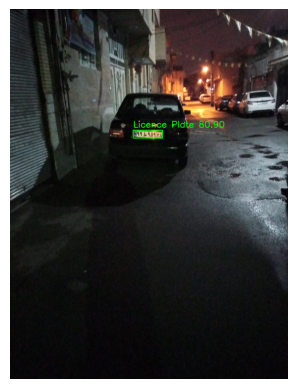


image 1/1 /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/001820.jpg: 640x480 1 license_plate, 12.1ms
Speed: 1.7ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


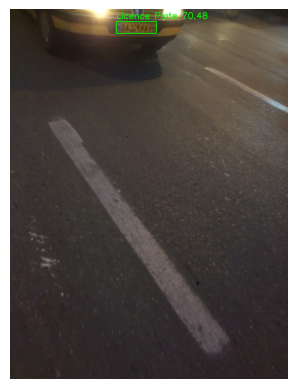


image 1/1 /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/002533.jpg: 640x480 2 license_plates, 12.2ms
Speed: 1.5ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


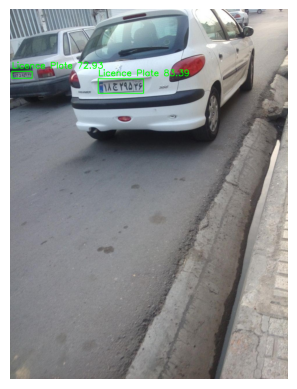


image 1/1 /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/005731.jpg: 480x640 1 license_plate, 67.7ms
Speed: 1.5ms preprocess, 67.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


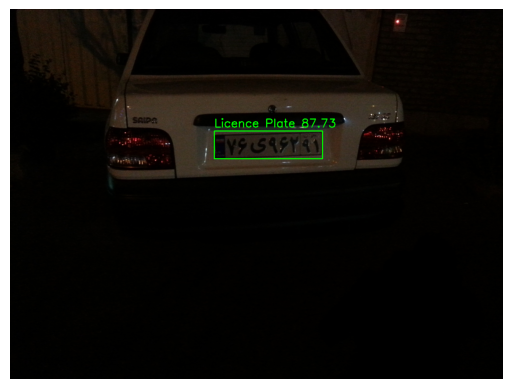


image 1/1 /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/images/005557.jpg: 416x640 1 license_plate, 70.3ms
Speed: 1.4ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


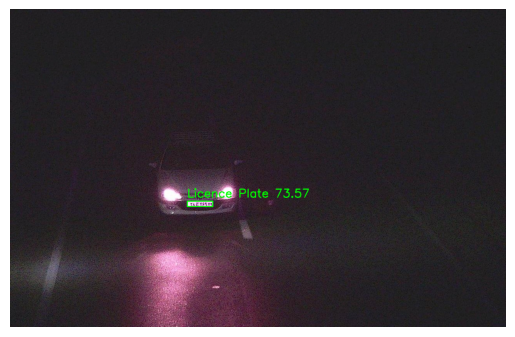

In [14]:
%matplotlib inline

COLOR = (0, 255, 0)
THICKNESS = 2
FONT = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 1

print("Testing model on sample images...")
for img_file in random.sample(image_files, 5):
    img_path = os.path.join(images_dir, img_file)

    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    results = LPD_model_trained(img_path)[0]
    conf = results.boxes.conf.cpu().numpy()
    boxes = results.boxes.xyxy.cpu().numpy().astype(int)

    for box, proba in zip(boxes, conf):
        x1, y1, x2, y2 = box
        pt1 = (x1, y1)
        pt2 = (x2, y2)
        text = "Licence Plate {:.2f}".format(proba * 100)
        text_pos = (x1, y1 - 10)
        cv2.rectangle(image, pt1, pt2, COLOR, THICKNESS)
        cv2.putText(image, text, text_pos, FONT, FONT_SCALE, COLOR, THICKNESS)

    plt.imshow(image)
    plt.axis(False)
    plt.show()

### 2. LPR - CNN

In [25]:
# Downloading LPR Dataset From Google Drive (Already donwloaded)
!gdown https://drive.google.com/uc?id=14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3

Downloading...
From (original): https://drive.google.com/uc?id=14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3
From (redirected): https://drive.google.com/uc?id=14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3&confirm=t&uuid=b0610d83-6699-4108-b816-56237e850694
To: /media/external_16TB_1/amir_vahedi/Q3/LPR.zip
100%|████████████████████████████████████████| 256M/256M [03:20<00:00, 1.28MB/s]


In [ ]:
# Unzip the Dataset (Already Extracted)
!mkdir LPR_FILES
!unzip LPR.zip -d LPR_FILES

In [15]:
BASE_PATH = "/media/external_16TB_1/amir_vahedi/Q3"
LPR_RELATIVE_PATH = 'LPR_FILES'

df = pd.read_csv(f'{BASE_PATH}/{LPR_RELATIVE_PATH}/valid_samples.csv')
df = df.sample(n=22000, random_state=42)
df.head()

,image_path,label
15319,15320.jpg,91و46621
24517,24518.jpg,98د48218
23316,23317.jpg,63د65688
3494,3495.jpg,15و92888
11216,11217.jpg,37ن57677


In [16]:
digit_vocabulary = "0123456789"
persian_letters = "آ ب پ ت ث ج چ ح خ د ذ ر ز ژ س ش ص ض ط ظ ع غ ف ق ک گ ل م ن و ه ی".split()



digit_to_idx = {char: idx for idx, char in enumerate(digit_vocabulary)}
letter_to_idx = {char: idx for idx, char in enumerate(persian_letters)}
idx_to_digit = {idx: char for idx, char in enumerate(digit_vocabulary)}
idx_to_letter = {idx: char for idx, char in enumerate(persian_letters)}

persian_to_english_digits = {
    '۰': '0', '۱': '1', '۲': '2', '۳': '3', '۴': '4',
    '۵': '5', '۶': '6', '۷': '7', '۸': '8', '۹': '9'
}

persian_letter_normalization = {
    "الف": "آ",
    "ا" : "آ",
    "ژ (معلولین و جانبازان)": "ژ",
    "ه‍" : "ه"
}


def translate(label):
    first_two_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[:2]])
    persian_letter = label[2]
    remaining_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[3:]])
    return first_two_digits + persian_letter + remaining_digits


def preprocess_sample(image_path,
                      label,
                      full_transform=True,
                      log=False,
                      dir_path=BASE_PATH ,
                      relative_path=f'{LPR_RELATIVE_PATH}/detections',
                      language='en'):
    if language == 'fa':
        label = translate(label)

    elif language != 'en':
        raise Exception('Un-supported language!')

    path = f'{dir_path}/{relative_path}'

    train_transform = transforms.Compose([
        transforms.Resize((100, 400)),
        transforms.ToTensor()
    ])

    test_transform = transforms.Compose([
        transforms.Resize((100, 400)),
        transforms.ToTensor(),
    ])

    transform = train_transform if full_transform else test_transform
    image = Image.open(f'{path}/{image_path}').convert("RGB")
    image = transform(image)

    for key, value in persian_letter_normalization.items():
        label = label.replace(key, value)


    if log:
        print(label)
        for i , c in enumerate(label):
            if c in persian_letters:
                c = '*'
            print(f"{i}:{c}", end=' | ')
        print()


    digits = torch.tensor([digit_to_idx[char] for char in label if char.isdigit()])
    letter = letter_to_idx[label[2]]

    return image, digits, letter

In [17]:
class PLPRDataset(data.Dataset):
    def __init__(self,
                 df,
                 split='train',
                 dir_path=BASE_PATH,
                 relative_path=f'{LPR_RELATIVE_PATH}/detections',
                 language='en'):
        self.df = df
        self.full_transform = True if split == 'train' else False
        self.dir_path = dir_path
        self.relative_path = relative_path
        self.language = language

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path, label = tuple(self.df.iloc[idx])
        image, digits, letter = preprocess_sample(
            image_path=image_path,
            label=label,
            full_transform=self.full_transform,
            dir_path=self.dir_path,
            relative_path=self.relative_path,
            language=self.language,
        )
        return image, digits, letter

In [18]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

class FCNPLPRModel(nn.Module):
    def __init__(self, backbone_name="efficientnet_b0"):
        super(FCNPLPRModel, self).__init__()
        self.backbone = models.efficientnet_b0(pretrained=True)
        self.backbone.classifier[1] = nn.Identity()
        
        self.digit_classifier = nn.Linear(1280, 7 * 10)
        self.letter_classifier = nn.Linear(1280, len(persian_letters))
        
        self.softmax = nn.Softmax(dim=-1)


    def forward(self, x):
        features = self.backbone(x)
        
        digit_outputs = self.digit_classifier(features)
        digit_outputs = digit_outputs.view(digit_outputs.size(0), 7, 10)
        digit_outputs = self.softmax(digit_outputs) # digit_outputs  -> [batch_size, 7, 10]
        
        letter_output = self.letter_classifier(features)
        letter_output = self.softmax(letter_output) # letter_output -> [batch_size, num_persian_letters]
        return digit_outputs, letter_output

In [19]:
BATCH_SIZE = 32

dataset = PLPRDataset(df)
dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
        persistent_workers=True
)

In [20]:
LPR_model = FCNPLPRModel().to(device)
digit_criterion = nn.CrossEntropyLoss()
letter_criterion = nn.CrossEntropyLoss()

total_params = sum(p.numel() for p in LPR_model.parameters())
print(f"Number of parameters: {total_params}")

Number of parameters: 4138210


/media/external_16TB_1/amir_vahedi/LensCraftEnv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/media/external_16TB_1/amir_vahedi/LensCraftEnv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [21]:
learning_rate = 4e-4

optimizer = optim.AdamW(LPR_model.parameters(), lr=learning_rate)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2,
    threshold=0.05,
    threshold_mode='rel',
    verbose=True
)

/media/external_16TB_1/amir_vahedi/LensCraftEnv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [22]:
def decode_predictions(digit_outputs, letter_output):
    digit_predictions = torch.argmax(digit_outputs, dim=2)  # [batch_size, 7]
    batch_size = digit_predictions.size(0)

    digits = []
    for b in range(batch_size):  # Iterate over batch
        sample_digits = []
        for i in range(7):  # Iterate over 7 digits
            try:
                sample_digits.append(idx_to_digit[digit_predictions[b][i].item()])
            except KeyError as e:
                print(f"KeyError: {e} (digit_predictions[{b}][{i}] = {digit_predictions[b][i].item()})")
                sample_digits.append("?")  # Use a placeholder for invalid indices
        digits.append(sample_digits)

    letter_prediction = torch.argmax(letter_output, dim=1)  # [batch_size]
    letters = []
    for b in range(batch_size):
        try:
            letters.append(idx_to_letter[letter_prediction[b].item()])
        except KeyError as e:
            print(f"KeyError: {e} (letter_prediction[{b}] = {letter_prediction[b].item()})")
            letters.append("?")  # Use a placeholder for invalid indices

    labels = []
    for b in range(batch_size):
        label = "".join(digits[b][:2]) + letters[b] + "".join(digits[b][2:])
        labels.append(label)

    return labels



def evaluate_misclassification(gt, pred):
    assert len(gt) == len(pred), "GT and Pred must have the same length."

    # Collect misclassified characters
    misclassified = []
    char_error_count = 0

    for i, (gt_char, pred_char) in enumerate(zip(gt, pred)):
        if gt_char != pred_char:
            misclassified.append(f"{gt_char} with {pred_char} at pos {i}")
            char_error_count += 1

    # Format the output
    misclassified_str = " , ".join(misclassified) if misclassified else "None"
    result = (f"GT: {gt} | Pred: {pred} | "
              f"Misclassified: {misclassified_str} | "
              f"Char error count: {char_error_count}")

    return result , char_error_count





def calculate_accuracy(model, df, device, dir_path=BASE_PATH, relative_path=f'{LPR_RELATIVE_PATH}/detections', language='en', log=False , cer = False):
    model.eval()
    FP= []
    CE = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for _, row in tqdm(df.iterrows(), total=len(df), ncols=100):
            image_path = row["image_path"]
            label = row["label"]
            try:
                image, true_digits, true_letter = preprocess_sample(image_path, label, full_transform=False, dir_path=dir_path, relative_path=relative_path, language=language)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")
                continue
            true_label = "".join([digit_vocabulary[d] for d in true_digits[:2]]) \
                         + persian_letters[true_letter] \
                         + "".join([digit_vocabulary[d] for d in true_digits[2:]])
            image = image.unsqueeze(0).to(device)
            digit_outputs, letter_output = model(image)

            predicted_labels = decode_predictions(digit_outputs, letter_output)

            if predicted_labels[0] == true_label:
                correct += 1
            elif log:
                report , char_error_count = evaluate_misclassification(true_label,predicted_labels[0])
                CE += char_error_count
                FP.append(report)
            total += 1


    accuracy = correct / total * 100

    if cer:
        print(f'CER: {100* CE/(8*df.shape[0]): .4f}%')

    if log:
         for false_positive in FP:
            print(false_positive)



    return accuracy

In [23]:
full_df = pd.read_csv(f'{BASE_PATH}/{LPR_RELATIVE_PATH}/valid_samples.csv')
test_df = full_df.loc[~full_df.index.isin(df.index)]

In [24]:
best_accuracy = 85.0
optimal_weights = None
num_epochs = 20


for epoch in range(num_epochs):
    LPR_model.train()
    total_loss = 0
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}", ncols=100)

    for images, digit_targets, letter_targets in progress_bar:
        images = images.to(device)
        digit_targets = digit_targets.to(device)
        letter_targets = letter_targets.to(device)

        # Forward pass
        LPR_model(images)
        digit_outputs, letter_output = LPR_model(images)

        digit_loss = 0
        for i in range(7):
            digit_loss += digit_criterion(digit_outputs[:, i, :], digit_targets[:, i])
        letter_loss = letter_criterion(letter_output, letter_targets)
        loss = digit_loss + letter_loss

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    avg_loss = total_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

    LPR_model.eval()
    accuracy = calculate_accuracy(
        LPR_model,
        test_df,
        device,
        relative_path= f'{LPR_RELATIVE_PATH}/detections',
        language='en'
    )
    print(f"Accuracy after Epoch {epoch+1}: {accuracy:.2f}%")

    scheduler.step(accuracy)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        optimal_weights = LPR_model.state_dict()  # Save the current model weights
        print(f"New best accuracy: {best_accuracy:.2f}%. Saving model weights.")
        torch.save(LPR_model.state_dict(), f'{BASE_PATH}/PLPR-CNN.pth')

if optimal_weights is not None:
    LPR_model.load_state_dict(optimal_weights)
    print("Loaded optimal weights into the model.")

Epoch 1/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 14.97it/s, loss=15.1]


Epoch 1/20, Average Loss: 17.1249


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 110.68it/s]


Accuracy after Epoch 1: 3.63%


Epoch 2/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.13it/s, loss=13.3]


Epoch 2/20, Average Loss: 14.0312


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.84it/s]


Accuracy after Epoch 2: 60.13%


Epoch 3/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.25it/s, loss=13.1]


Epoch 3/20, Average Loss: 13.1394


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.78it/s]


Accuracy after Epoch 3: 89.42%
New best accuracy: 89.42%. Saving model weights.


Epoch 4/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.04it/s, loss=12.9]


Epoch 4/20, Average Loss: 12.9365


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 111.76it/s]


Accuracy after Epoch 4: 90.04%
New best accuracy: 90.04%. Saving model weights.


Epoch 5/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.13it/s, loss=12.9]


Epoch 5/20, Average Loss: 12.8896


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 111.07it/s]


Accuracy after Epoch 5: 91.29%
New best accuracy: 91.29%. Saving model weights.


Epoch 6/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.14it/s, loss=12.8]


Epoch 6/20, Average Loss: 12.8668


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 111.68it/s]


Accuracy after Epoch 6: 91.33%
New best accuracy: 91.33%. Saving model weights.


Epoch 7/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.22it/s, loss=12.9]


Epoch 7/20, Average Loss: 12.8588


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 111.09it/s]


Accuracy after Epoch 7: 91.33%


Epoch 8/20: 100%|██████████████████████████████████████| 688/688 [00:45<00:00, 15.15it/s, loss=12.8]


Epoch 8/20, Average Loss: 12.8460


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 109.26it/s]


Accuracy after Epoch 8: 92.23%
New best accuracy: 92.23%. Saving model weights.


Epoch 9/20: 100%|██████████████████████████████████████| 688/688 [00:44<00:00, 15.34it/s, loss=12.8]


Epoch 9/20, Average Loss: 12.8391


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.73it/s]


Accuracy after Epoch 9: 92.00%


Epoch 10/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.23it/s, loss=12.8]


Epoch 10/20, Average Loss: 12.8364


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 111.67it/s]


Accuracy after Epoch 10: 92.03%


Epoch 11/20: 100%|█████████████████████████████████████| 688/688 [00:44<00:00, 15.35it/s, loss=12.9]


Epoch 11/20, Average Loss: 12.8316


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 113.21it/s]


Accuracy after Epoch 11: 92.35%
New best accuracy: 92.35%. Saving model weights.


Epoch 12/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.14it/s, loss=13.1]


Epoch 12/20, Average Loss: 12.8278


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 113.09it/s]


Accuracy after Epoch 12: 91.76%


Epoch 13/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.17it/s, loss=12.8]


Epoch 13/20, Average Loss: 12.8259


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.53it/s]


Accuracy after Epoch 13: 92.27%


Epoch 14/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.10it/s, loss=12.9]


Epoch 14/20, Average Loss: 12.8228


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 113.40it/s]


Accuracy after Epoch 14: 92.39%
New best accuracy: 92.39%. Saving model weights.


Epoch 15/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.05it/s, loss=12.7]


Epoch 15/20, Average Loss: 12.8218


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.35it/s]


Accuracy after Epoch 15: 92.66%
New best accuracy: 92.66%. Saving model weights.


Epoch 16/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.08it/s, loss=12.8]


Epoch 16/20, Average Loss: 12.8196


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.72it/s]


Accuracy after Epoch 16: 93.64%
New best accuracy: 93.64%. Saving model weights.


Epoch 17/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.07it/s, loss=12.8]


Epoch 17/20, Average Loss: 12.8070


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 110.42it/s]


Accuracy after Epoch 17: 93.75%
New best accuracy: 93.75%. Saving model weights.


Epoch 18/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.24it/s, loss=12.8]


Epoch 18/20, Average Loss: 12.8035


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 112.16it/s]


Accuracy after Epoch 18: 93.83%
New best accuracy: 93.83%. Saving model weights.


Epoch 19/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.24it/s, loss=12.9]


Epoch 19/20, Average Loss: 12.8015


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 113.04it/s]


Accuracy after Epoch 19: 93.99%
New best accuracy: 93.99%. Saving model weights.


Epoch 20/20: 100%|█████████████████████████████████████| 688/688 [00:45<00:00, 15.10it/s, loss=12.9]


Epoch 20/20, Average Loss: 12.8002


100%|██████████████████████████████████████████████████████████| 2561/2561 [00:22<00:00, 111.43it/s]

Accuracy after Epoch 20: 93.87%
Loaded optimal weights into the model.


In [25]:
# Calculate accuracy
accuracy = calculate_accuracy(LPR_model, test_df, device, cer=True, log=True)
print(f"Accuracy: {accuracy:.2f}%")

100%|██████████████████████████████████████████████████████████| 2561/2561 [00:23<00:00, 110.62it/s]

CER:  1.0445%
GT: 51ژ66416 | Pred: 51ع66416 | Misclassified: ژ with ع at pos 2 | Char error count: 1
GT: 57ژ46711 | Pred: 57ع46711 | Misclassified: ژ with ع at pos 2 | Char error count: 1
GT: 12آ79318 | Pred: 12ع79318 | Misclassified: آ with ع at pos 2 | Char error count: 1
GT: 81ع27744 | Pred: 81ع37744 | Misclassified: 2 with 3 at pos 3 | Char error count: 1
GT: 52ع35813 | Pred: 52ع35812 | Misclassified: 3 with 2 at pos 7 | Char error count: 1
GT: 45ت87733 | Pred: 45ت87722 | Misclassified: 3 with 2 at pos 6 , 3 with 2 at pos 7 | Char error count: 2
GT: 91ی36388 | Pred: 61ی36388 | Misclassified: 9 with 6 at pos 0 | Char error count: 1
GT: 74ه62255 | Pred: 74ه63355 | Misclassified: 2 with 3 at pos 4 , 2 with 3 at pos 5 | Char error count: 2
GT: 87ه59611 | Pred: 86ه59611 | Misclassified: 7 with 6 at pos 1 | Char error count: 1
GT: 64ه65878 | Pred: 64ه63888 | Misclassified: 5 with 3 at pos 4 , 7 with 8 at pos 6 | Char error count: 2
GT: 25ن39719 | Pred: 35ن39719 | Misclassified: 2 with 3 

### 3. E2E LPDR

load the models from part 2 and 3, build a class named E2E_LPDR and plot report the metrics (accuracy and cer) for the test dataset (20% of LPD that has Splitted in section 1 ). you must also plot some samples with predicted bounding box and label too.


note that each picture might have multiple plates but in this test data for simplicity all samples just have a single plate exists in it.
plot some samples from your pipeline (predicted bb from an image + predicted label of it)


## Loading Trained Models from Section#1 and Section#2

In [407]:
# Defining Device:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Loading the LPD and LPR Models:
BASE_PATH = "/media/external_16TB_1/amir_vahedi/Q3"

LPD_model_path = os.path.join(BASE_PATH, "yolo12n_trained.pt")
LPR_model_path = os.path.join(BASE_PATH, "PLPR-CNN.pth")

LPD_model_final = YOLO(LPD_model_path)
LPR_model_final = FCNPLPRModel().to(device)
LPR_model_final.load_state_dict(torch.load(LPR_model_path))

Using device: cuda


<All keys matched successfully>

## Plotting Metrics Report

In [408]:
# Utility function to plot an image
def plot_image(img, title, figsize=(8, 6)):
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.axis(False)
    plt.show()


# Function to plot saved images by ultralytics during training and validation of LPD Model:
def plot_LPD_info(train_info=True, val_info=False):
    train_results_path = os.path.join(BASE_PATH, "runs/detect/train/")
    val_results_path = os.path.join(BASE_PATH, "runs/detect/val/")
    results_img_paths = []
    if train_info:
        results_img_paths.extend([os.path.join(train_results_path, f) for f in os.listdir(train_results_path) if f.endswith(('.jpg', '.jpeg', '.png'))])
    if val_info:
        results_img_paths.extend([os.path.join(val_results_path, f) for f in os.listdir(val_results_path) if f.endswith(('.jpg', '.jpeg', '.png'))])
        
    for img_path in results_img_paths:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img_title = img_path.split("/")[-1].split(".")[0]
        plot_image(img, img_title)


# Utility function to plot recorded log by ultralytics during training and validation:
def plot_LPD_training_info():
     results_path = os.path.join(BASE_PATH, "runs/detect/train/results.csv")
     results_csv = pd.read_csv(results_path)
     epochs = len(results_csv)
     fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(8, 14))

     ax[0].plot(results_csv['epoch'], results_csv['train/box_loss'], label='Train: Box Loss', color="red")
     ax[0].plot(results_csv['epoch'], results_csv['train/cls_loss'], label='Train: Classification Loss', color="green")
     ax[0].plot(results_csv['epoch'], results_csv['train/dfl_loss'], label='Train: DFL Loss', color="blue")
     ax[0].plot(results_csv['epoch'], results_csv['val/box_loss'], label='Validation: Box Loss', color="red", alpha=0.5)
     ax[0].plot(results_csv['epoch'], results_csv['val/cls_loss'], label='Validation: Classification Loss', color="green", alpha=0.5)
     ax[0].plot(results_csv['epoch'], results_csv['val/dfl_loss'], label='Validation: DFL Loss', color="blue", alpha=0.5)
     ax[0].set_xlabel('Epoch')
     ax[0].set_ylabel('Loss')
     ax[0].set_title('Train Loss over Epochs')
     ax[0].set_xlim([1, epochs])
     ax[0].grid()
     ax[0].legend()

     ax[1].plot(results_csv['epoch'], results_csv['metrics/precision(B)'], label='Precision')
     ax[1].plot(results_csv['epoch'], results_csv['metrics/recall(B)'], label='Recall')
     ax[1].set_xlabel('Epoch')
     ax[1].set_ylabel('Precision / Recall')
     ax[1].set_title('Precision and Recall')
     ax[1].set_xlim([1, epochs])
     ax[1].grid()
     ax[1].legend()
    
     ax[2].plot(results_csv['epoch'], results_csv['metrics/mAP50(B)'], label=' mAP50')
     ax[2].plot(results_csv['epoch'], results_csv['metrics/mAP50-95(B)'], label='mAP50-95')
     ax[2].set_xlabel('Epoch')
     ax[2].set_ylabel('mAP')
     ax[2].set_title('mAP50 and mAP50-95')
     ax[2].set_xlim([1, epochs])
     ax[2].grid()
     ax[2].legend()
     plt.tight_layout()
     plt.show()
    

# Utility function to print final result of LPD model:
def final_results_PLD(LPD_model):
    metrics = LPD_model.val()
    print("Final Results: ")
    print(f"mAP50-95: {metrics.box.map}")
    print(f"mAP50: {metrics.box.map50}")
    print(f"mAP75: {metrics.box.map75}")


# Function to get random image and label from splitted test set
def get_random_test_image():
    test_images = sorted([f for f in os.listdir(val_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])
    test_labels = sorted([f for f in os.listdir(val_labels_dir) if f.endswith(('.txt'))])

    idx = random.randint(0, len(test_images) - 1)
    
    image_path = os.path.join(val_images_dir, test_images[idx])
    label_path = os.path.join(val_labels_dir, test_labels[idx])

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    with open(label_path, 'r') as file:
        label = file.read()
        
    return image, label

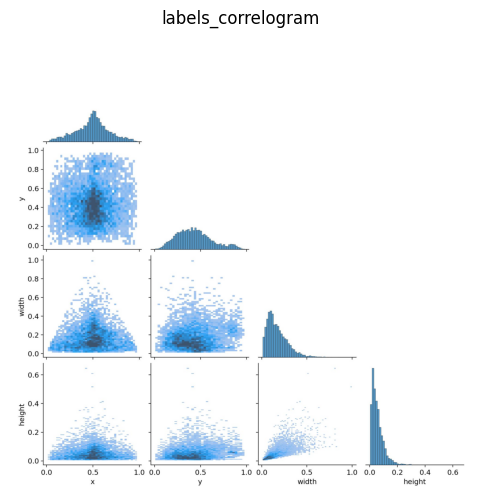

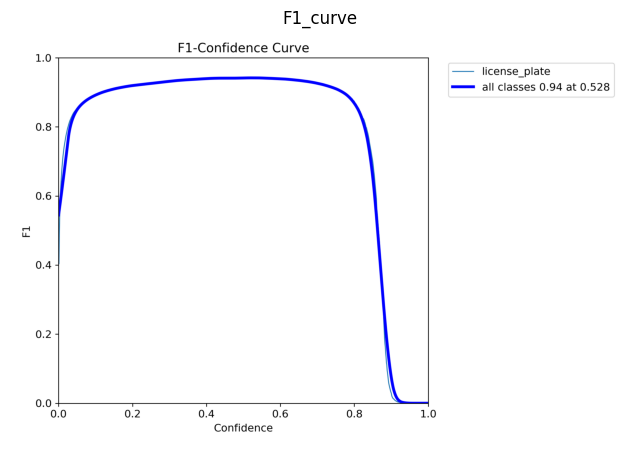

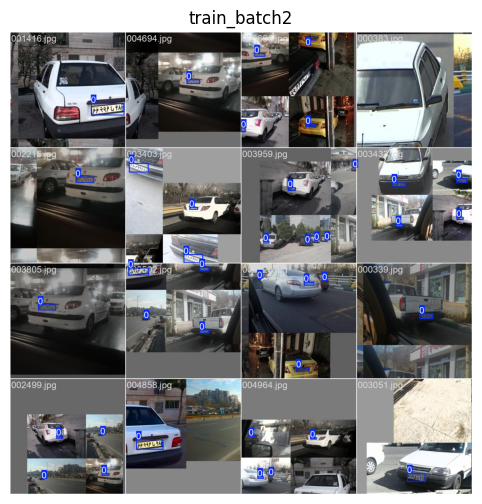

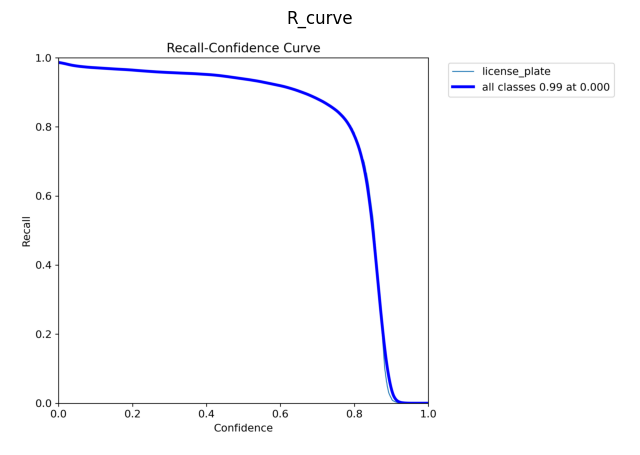

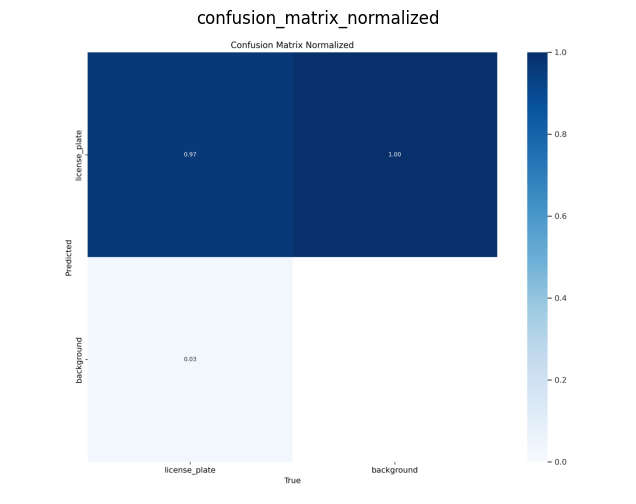

...

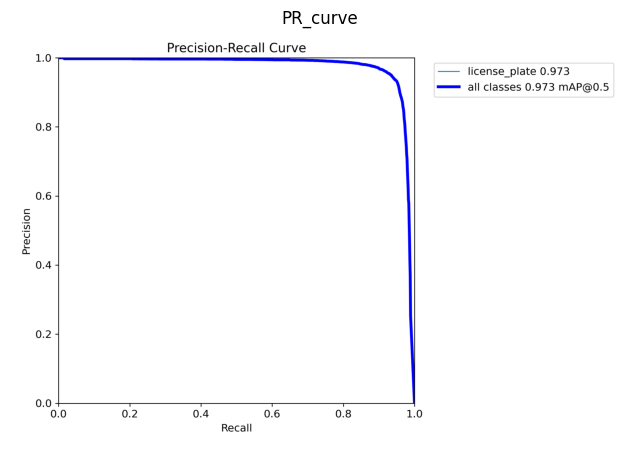

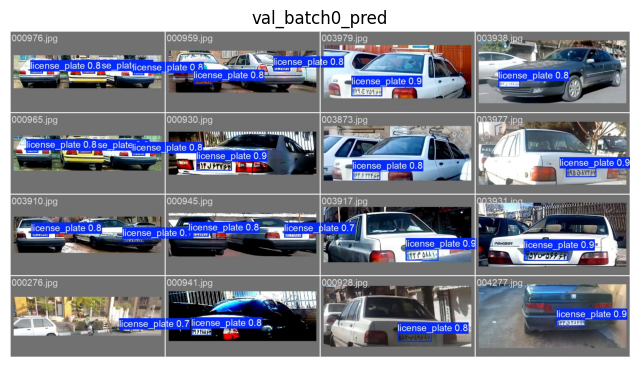

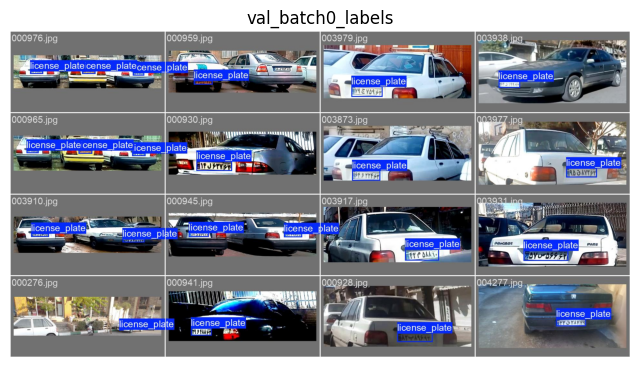

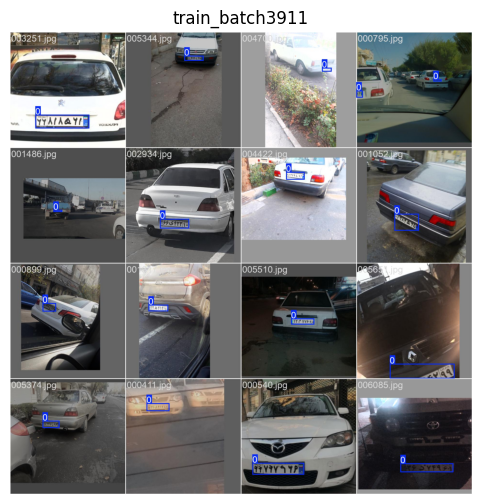

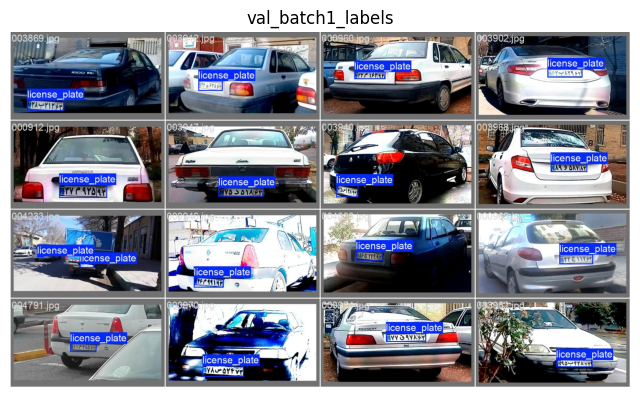

In [409]:
plot_LPD_info()

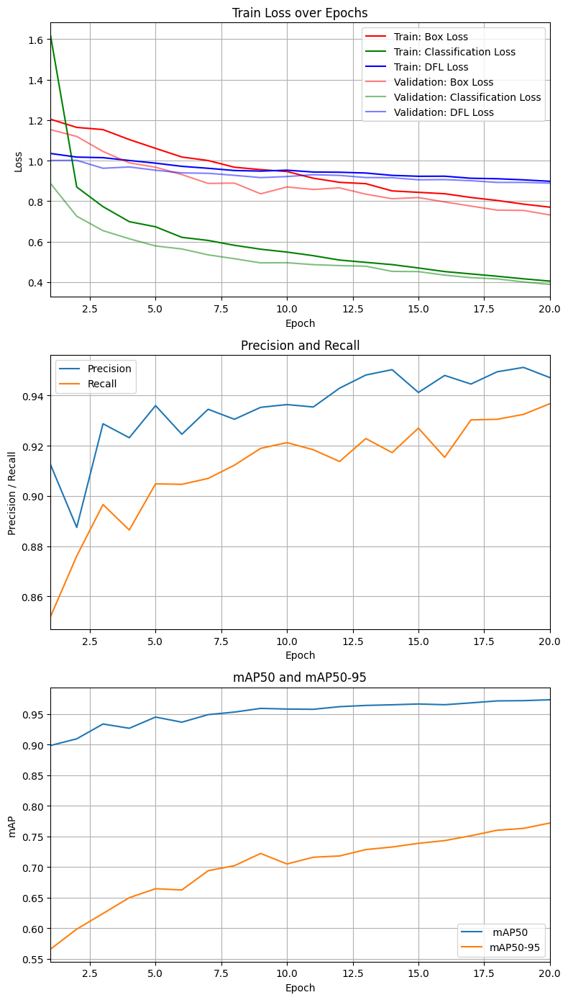

In [410]:
plot_LPD_training_info()

In [411]:
final_results_PLD(LPD_model_final)

Ultralytics 8.3.95 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090 Ti, 24142MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /media/external_16TB_1/amir_vahedi/Q3/LPD_FILES/labels/val.cache... 1252 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1252/1252 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:04<00:00, 15.81it/s]


                   all       1252       1348      0.955      0.952      0.974      0.758
Speed: 0.2ms preprocess, 1.1ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/val9
Final Results: 
mAP50-95: 0.7583904298376022
mAP50: 0.9742368459921567
mAP75: 0.8738377018773891


## Putting LPD and PLR Models together and Create an End-to-End Model

In [412]:
COLOR = (0, 255, 0)
THICKNESS = 2
FONT = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 1

# End-to-End model for Licence Plate Detection and Prediction
class E2E_LPDR(nn.Module):
    def __init__(self, LPD_model, LPR_model):
        super(E2E_LPDR, self).__init__()
        self.LPD_model = LPD_model
        self.LPR_model = LPR_model
        self.test_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((100, 400)),
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.unsqueeze(0))
        ])

    def forward(self, x):
        print("Processing: Licence Plate Detection Phase...")
        results = self.LPD_model(x)[0]
        boxes = results.boxes.xyxy.cpu().numpy().astype(int)
        conf = results.boxes.conf.cpu().numpy()
        
        print("Plotting: Bounding Box(es)...")
        self.plot_bounding_boxes(x, boxes, conf)
        
        print("\nProcessing: Licence Plate Recognition Phase...")
        self.LPR_model.eval()
        for box, proba in zip(boxes, conf):
            x1, y1, x2, y2 = box
            pt1 = (x1, y1)
            pt2 = (x2, y2)
            licence_plate_img = x[y1:y2, x1:x2]
            licence_plate_img_tensor = self.test_transform(licence_plate_img).to(device)
            with torch.no_grad():  
                digits, letter = self.LPR_model.forward(licence_plate_img_tensor)
                
            digits_tensor = digits.clone().cpu().squeeze()
            letter_tensor = letter.clone().cpu().squeeze()

            digits_idx = torch.argmax(digits_tensor, dim=1).numpy().tolist()
            letter_idx = torch.argmax(letter_tensor, dim=0).numpy().tolist()

            print("Plotting: Licence Plate(s)...")
            self.plot_licence_plate(licence_plate_img, 
                                    digits_idx, 
                                    persian_letters[letter_idx])


    def plot_bounding_boxes(self, image, boxes, conf):
        for box, proba in zip(boxes, conf):
            x1, y1, x2, y2 = box
            pt1 = (x1, y1)
            pt2 = (x2, y2)
            text = "Licence Plate {:.2f}".format(proba * 100)
            text_pos = (x1, y1 - 10)
            cv2.rectangle(image, pt1, pt2, COLOR, THICKNESS)
            cv2.putText(image, text, text_pos, FONT, FONT_SCALE, COLOR, THICKNESS)
        plot_image(image, "Bounding Box(es)")
            

    def plot_licence_plate(self, licence_plate_image, digits, letter):
        title = "Prediction Digits: {}\nPrediction Letter: {}".format(digits, letter)
        plot_image(licence_plate_image, title)


LPDR_model = E2E_LPDR(LPD_model_final, LPR_model_final)

#######################################################################
############################## SAMPLE #1 ##############################
#######################################################################
Plotting: Original Image...


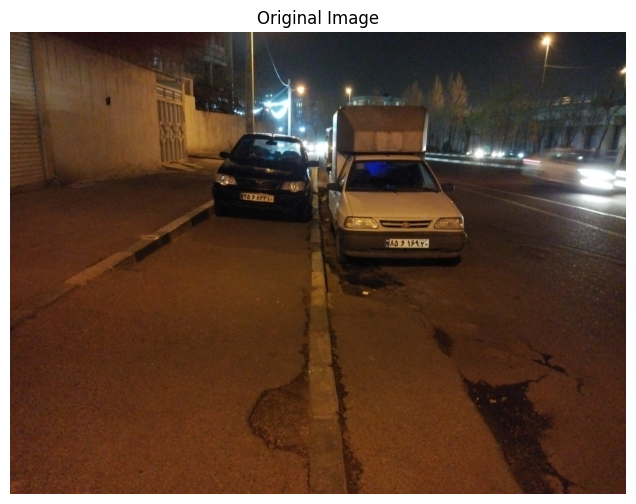

Processing: Licence Plate Detection Phase...

0: 480x640 2 license_plates, 12.2ms
Speed: 1.9ms preprocess, 12.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
Plotting: Bounding Box(es)...


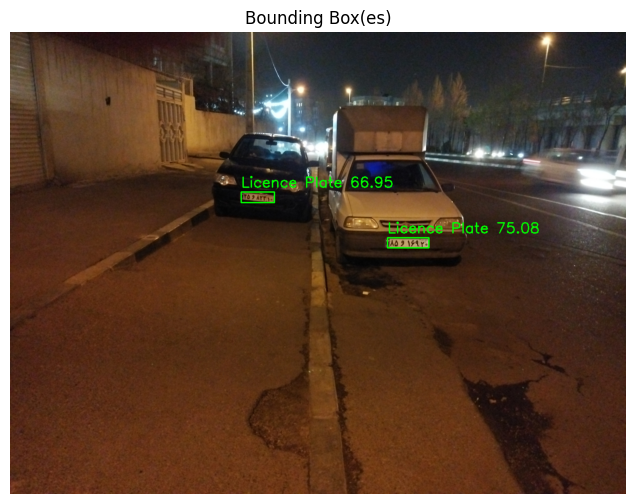


Processing: Licence Plate Recognition Phase...
Plotting: Licence Plate(s)...


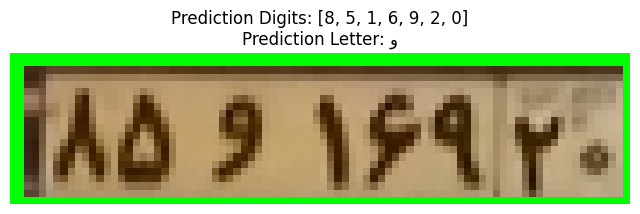

Plotting: Licence Plate(s)...


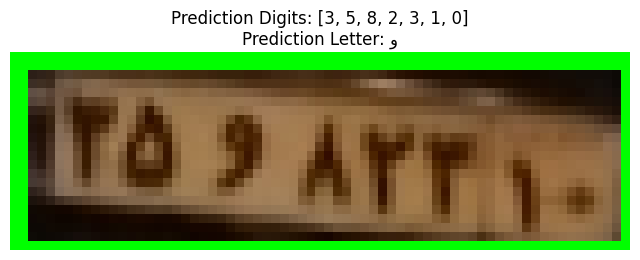

#######################################################################
############################## SAMPLE #2 ##############################
#######################################################################
Plotting: Original Image...


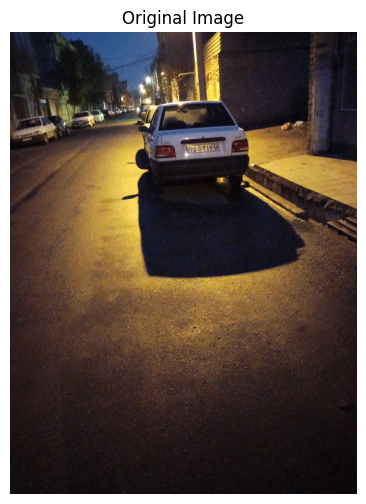

Processing: Licence Plate Detection Phase...

0: 640x480 1 license_plate, 12.1ms
Speed: 1.7ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Plotting: Bounding Box(es)...


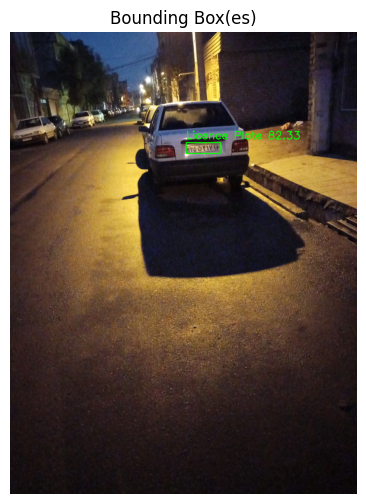


Processing: Licence Plate Recognition Phase...
Plotting: Licence Plate(s)...


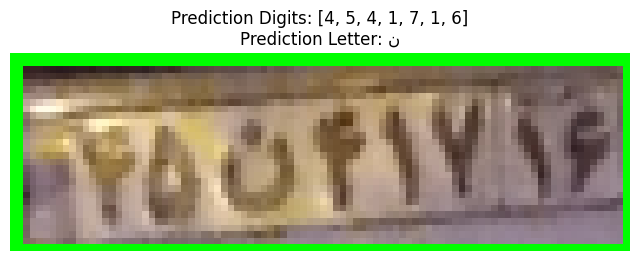

#######################################################################
############################## SAMPLE #3 ##############################
#######################################################################
Plotting: Original Image...


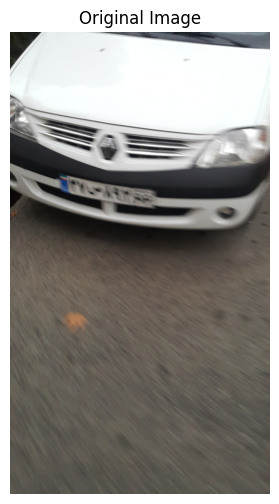

Processing: Licence Plate Detection Phase...

0: 640x384 1 license_plate, 12.4ms
Speed: 1.5ms preprocess, 12.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)
Plotting: Bounding Box(es)...


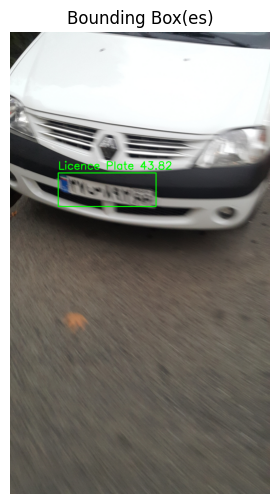


Processing: Licence Plate Recognition Phase...
Plotting: Licence Plate(s)...


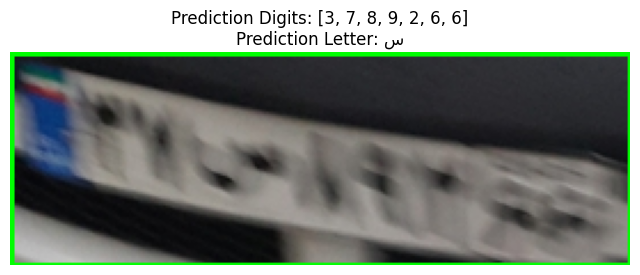

In [414]:
# Plotting some random images from the splitted test set, plotting bounding boxes, recognizing digits and letter
for i in range(3):
    print("#######################################################################")
    print("############################## SAMPLE #{} ##############################".format(i+1))
    print("#######################################################################")
    
    test_image, test_label = get_random_test_image()
    print("Plotting: Original Image...")
    plot_image(test_image, "Original Image")
    LPDR_model(test_image)